In [2]:
%tensorflow_version 1.x

# 화재 영상 탐지

copy from https://www.pyimagesearch.com/2019/11/18/fire-and-smoke-detection-with-keras-and-deep-learning/

# 데이터 파일 준비

In [21]:
!wget https://github.com/dhrim/pis_study/raw/master/fire_detection/Fire.tar.gz
!wget https://github.com/dhrim/pis_study/raw/master/fire_detection/spatial_envelope_static_8outdoorcategories.tar.gz

--2020-07-20 11:35:32--  https://github.com/dhrim/pis_study/raw/master/fire_detection/Fire.tar.gz
Resolving github.com (github.com)... 140.82.118.4
Connecting to github.com (github.com)|140.82.118.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/dhrim/pis_study/master/fire_detection/Fire.tar.gz [following]
--2020-07-20 11:35:33--  https://raw.githubusercontent.com/dhrim/pis_study/master/fire_detection/Fire.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12888805 (12M) [application/octet-stream]
Saving to: ‘Fire.tar.gz’

Fire.tar.gz         100%[===================>]  12.29M  53.9MB/s    in 0.2s    

2020-07-20 11:35:34 (53.9 MB/s) - ‘Fire.tar.gz’ saved [12888805/12888805]

--2020-07-20 11:35

In [23]:
!ls -al

total 29092
drwxr-xr-x 1 root root      4096 Jul 20 11:35 .
drwxr-xr-x 1 root root      4096 Jul 20 10:03 ..
drwxr-xr-x 1 root root      4096 Jul 15 16:11 .config
-rwxr-xr-x 1  501 staff      212 Jul 20 11:15 ._Fire
-rw-r--r-- 1 root root  12888805 Jul 20 11:35 Fire.tar.gz
drwxr-xr-x 1 root root      4096 Jul 10 16:29 sample_data
-rwxr-xr-x 1  501 staff      187 Nov 22  2006 ._spatial_envelope_static_8outdoorcategories
-rw-r--r-- 1 root root  16875184 Jul 20 11:35 spatial_envelope_static_8outdoorcategories.tar.gz


In [24]:
!tar xvfz spatial_envelope_static_8outdoorcategories.tar.gz
!tar xvfz Fire.tar.gz

spatial_envelope_static_8outdoorcategories/
spatial_envelope_static_8outdoorcategories/coast_arnat59.jpg
spatial_envelope_static_8outdoorcategories/coast_art1130.jpg
spatial_envelope_static_8outdoorcategories/coast_art294.jpg
spatial_envelope_static_8outdoorcategories/coast_art487.jpg
spatial_envelope_static_8outdoorcategories/coast_bea1.jpg
spatial_envelope_static_8outdoorcategories/coast_bea10.jpg
spatial_envelope_static_8outdoorcategories/coast_bea14.jpg
spatial_envelope_static_8outdoorcategories/coast_bea2.jpg
spatial_envelope_static_8outdoorcategories/coast_bea20.jpg
spatial_envelope_static_8outdoorcategories/coast_bea24.jpg
spatial_envelope_static_8outdoorcategories/coast_bea26.jpg
spatial_envelope_static_8outdoorcategories/coast_bea27.jpg
spatial_envelope_static_8outdoorcategories/coast_bea29.jpg
spatial_envelope_static_8outdoorcategories/coast_bea3.jpg
spatial_envelope_static_8outdoorcategories/coast_bea30.jpg
spatial_envelope_static_8outdoorcategories/coast_bea33.jpg
spatial_e

In [25]:
!ls Fire/*jpg | wc -l
!ls spatial_envelope_static_8outdoorcategories/*.jpg | wc -l

1315
2688


# 설정 값 정의

In [26]:
import os
# initialize the path to the fire and non-fire dataset directories
FIRE_PATH = "Fire"
NON_FIRE_PATH = "spatial_envelope_static_8outdoorcategories"

# initialize the class labels in the dataset
CLASSES = ["Non-Fire", "Fire"]

# define the size of the training and testing split
TRAIN_SPLIT = 0.75
TEST_SPLIT = 0.25

# define the initial learning rate, batch size, and number of epochs
INIT_LR = 1e-2
BATCH_SIZE = 64
NUM_EPOCHS = 50

# set the path to the serialized model after training
# MODEL_PATH = os.path.sep.join(["output", "fire_detection.model"])
MODEL_PATH = "fire_detection.model"

# define the path to the output learning rate finder plot and
# training history plot
LRFIND_PLOT_PATH = os.path.sep.join(["output", "lrfind_plot.png"])
TRAINING_PLOT_PATH = os.path.sep.join(["output", "training_plot.png"])

# define the path to the output directory that will store our final
# output with labels/annotations along with the number of iamges to
# sample
OUTPUT_IMAGE_PATH = os.path.sep.join(["output", "examples"])
SAMPLE_SIZE = 50

# 모듈 임포팅

아래 matplotlib.use("Agg")를 호출하면 그림이 그려지지 않는다.

In [27]:
# set the matplotlib backend so figures can be saved in the background
import matplotlib

# matplotlib.use("Agg")

In [28]:
# import the necessary packages
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import cv2

# 데이터 로딩과 준비

## 화일 로딩 함수

In [29]:
def load_dataset(datasetPath):
    # grab the paths to all images in our dataset directory, then
    # initialize our lists of images
    imagePaths = list(paths.list_images(datasetPath))
    data = []

    # loop over the image paths
    for imagePath in imagePaths:
        # load the image and resize it to be a fixed 128x128 pixels,
        # ignoring aspect ratio
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (128, 128))

        # add the image to the data lists
        data.append(image)

    # return the data list as a NumPy array
    return np.array(data, dtype="float32")

## 영상 데이터 파일 로딩

In [30]:
# load the fire and non-fire images
print("[INFO] loading data...")
fireData = load_dataset(FIRE_PATH)
nonFireData = load_dataset(NON_FIRE_PATH)

[INFO] loading data...


In [31]:
print(fireData.shape)
print(nonFireData.shape)

(1315, 128, 128, 3)
(2688, 128, 128, 3)


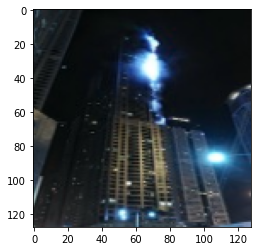

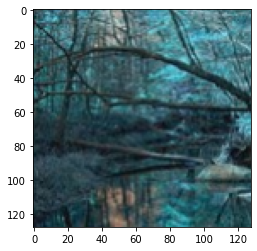

In [32]:
plt.imshow(fireData[0]/255)
plt.show()

plt.imshow(nonFireData[0]/255)
plt.show()

## 레이블링 데이터 준비

In [33]:
fire_data_count = fireData.shape[0]
non_fire_data_count = nonFireData.shape[0]

# construct the class labels for the data
fireLabels = np.ones((fire_data_count,))
nonFireLabels = np.zeros((non_fire_data_count,))

In [34]:
print(fireLabels.shape)
print(nonFireLabels.shape)

(1315,)
(2688,)


## 읽은 데이터 하나로 합치기

In [35]:
# stack the fire data with the non-fire data, then scale the data
# to the range [0, 1]
data = np.vstack([fireData, nonFireData])
labels = np.hstack([fireLabels, nonFireLabels])

In [36]:
print(data.shape)
print(labels.shape)

(4003, 128, 128, 3)
(4003,)


## 데이터 Normalization

In [37]:
data /= 255

## class weights 구하기

2개 클래스 별 데이터 수가 다르다. 학습 시에 이를 보완하기 위한 class weight를 구한다.

```
데이터 갯수     : 2688 : 1315
class weight : 1 : 2.044
```

In [38]:
# perform one-hot encoding on the labels and account for skew in the
# labeled data
print(labels[:5])
labels = to_categorical(labels, num_classes=2)
print(labels[:5])

classTotals = labels.sum(axis=0)
print("classTotals :", classTotals)

classWeight = classTotals.max() / classTotals
print("classWeight :", classWeight)


[1. 1. 1. 1. 1.]
[[0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]]
classTotals : [2688. 1315.]
classWeight : [1.        2.0441065]


## 데이터 쪼개기

In [39]:
# construct the training and testing split
(trainX, testX, trainY, testY) = train_test_split(data, labels,
                                                  test_size=TEST_SPLIT, random_state=42)

In [40]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(testY.shape)

(3002, 128, 128, 3)
(3002, 2)
(1001, 128, 128, 3)
(1001, 2)


# 모델 정의

In [41]:
# FireDetectionNet
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import SeparableConv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense

class FireDetectionNet:
	@staticmethod
	def build(width, height, depth, classes):
		# initialize the model along with the input shape to be
		# "channels last" and the channels dimension itself
		model = Sequential()
		inputShape = (height, width, depth)
		chanDim = -1

		# CONV => RELU => POOL
		model.add(SeparableConv2D(16, (7, 7), padding="same",
			input_shape=inputShape))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		# CONV => RELU => POOL
		model.add(SeparableConv2D(32, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		# (CONV => RELU) * 2 => POOL
		model.add(SeparableConv2D(64, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(SeparableConv2D(64, (3, 3), padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
		model.add(MaxPooling2D(pool_size=(2, 2)))

		# first set of FC => RELU layers
		model.add(Flatten())
		model.add(Dense(128))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
		model.add(Dropout(0.5))

		# second set of FC => RELU layers
		model.add(Dense(128))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
		model.add(Dropout(0.5))

		# softmax classifier
		model.add(Dense(classes))
		model.add(Activation("softmax"))

		# return the constructed network architecture
		return model

# 적정 학습율 찾기

학습 전에 이 코드를 사용해서 적정 학습율을 찾는다. 

그런 이유로 실제 사용되지는 않는다.

In [42]:
# import the necessary packages
from tensorflow.keras.callbacks import LambdaCallback
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import numpy as np
import tempfile

class LearningRateFinder:
	def __init__(self, model, stopFactor=4, beta=0.98):
		# store the model, stop factor, and beta value (for computing
		# a smoothed, average loss)
		self.model = model
		self.stopFactor = stopFactor
		self.beta = beta

		# initialize our list of learning rates and losses,
		# respectively
		self.lrs = []
		self.losses = []

		# initialize our learning rate multiplier, average loss, best
		# loss found thus far, current batch number, and weights file
		self.lrMult = 1
		self.avgLoss = 0
		self.bestLoss = 1e9
		self.batchNum = 0
		self.weightsFile = None

	def reset(self):
		# re-initialize all variables from our constructor
		self.lrs = []
		self.losses = []
		self.lrMult = 1
		self.avgLoss = 0
		self.bestLoss = 1e9
		self.batchNum = 0
		self.weightsFile = None

	def is_data_iter(self, data):
		# define the set of class types we will check for
		iterClasses = ["NumpyArrayIterator", "DirectoryIterator",
			 "DataFrameIterator", "Iterator", "Sequence"]

		# return whether our data is an iterator
		return data.__class__.__name__ in iterClasses

	def on_batch_end(self, batch, logs):
		# grab the current learning rate and add log it to the list of
		# learning rates that we've tried
		lr = K.get_value(self.model.optimizer.lr)
		self.lrs.append(lr)

		# grab the loss at the end of this batch, increment the total
		# number of batches processed, compute the average average
		# loss, smooth it, and update the losses list with the
		# smoothed value
		l = logs["loss"]
		self.batchNum += 1
		self.avgLoss = (self.beta * self.avgLoss) + ((1 - self.beta) * l)
		smooth = self.avgLoss / (1 - (self.beta ** self.batchNum))
		self.losses.append(smooth)

		# compute the maximum loss stopping factor value
		stopLoss = self.stopFactor * self.bestLoss

		# check to see whether the loss has grown too large
		if self.batchNum > 1 and smooth > stopLoss:
			# stop returning and return from the method
			self.model.stop_training = True
			return

		# check to see if the best loss should be updated
		if self.batchNum == 1 or smooth < self.bestLoss:
			self.bestLoss = smooth

		# increase the learning rate
		lr *= self.lrMult
		K.set_value(self.model.optimizer.lr, lr)

	def find(self, trainData, startLR, endLR, epochs=None,
		stepsPerEpoch=None, batchSize=32, sampleSize=2048,
		classWeight=None, verbose=1):
		# reset our class-specific variables
		self.reset()

		# determine if we are using a data generator or not
		useGen = self.is_data_iter(trainData)

		# if we're using a generator and the steps per epoch is not
		# supplied, raise an error
		if useGen and stepsPerEpoch is None:
			msg = "Using generator without supplying stepsPerEpoch"
			raise Exception(msg)

		# if we're not using a generator then our entire dataset must
		# already be in memory
		elif not useGen:
			# grab the number of samples in the training data and
			# then derive the number of steps per epoch
			numSamples = len(trainData[0])
			stepsPerEpoch = np.ceil(numSamples / float(batchSize))

		# if no number of training epochs are supplied, compute the
		# training epochs based on a default sample size
		if epochs is None:
			epochs = int(np.ceil(sampleSize / float(stepsPerEpoch)))

		# compute the total number of batch updates that will take
		# place while we are attempting to find a good starting
		# learning rate
		numBatchUpdates = epochs * stepsPerEpoch

		# derive the learning rate multiplier based on the ending
		# learning rate, starting learning rate, and total number of
		# batch updates
		self.lrMult = (endLR / startLR) ** (1.0 / numBatchUpdates)

		# create a temporary file path for the model weights and
		# then save the weights (so we can reset the weights when we
		# are done)
		self.weightsFile = tempfile.mkstemp()[1]
		self.model.save_weights(self.weightsFile)

		# grab the *original* learning rate (so we can reset it
		# later), and then set the *starting* learning rate
		origLR = K.get_value(self.model.optimizer.lr)
		K.set_value(self.model.optimizer.lr, startLR)

		# construct a callback that will be called at the end of each
		# batch, enabling us to increase our learning rate as training
		# progresses
		callback = LambdaCallback(on_batch_end=lambda batch, logs:
			self.on_batch_end(batch, logs))

		# check to see if we are using a data iterator
		if useGen:
			self.model.fit_generator(
				trainData,
				steps_per_epoch=stepsPerEpoch,
				epochs=epochs,
				class_weight=classWeight,
				verbose=verbose,
				callbacks=[callback])

		# otherwise, our entire training data is already in memory
		else:
			# train our model using Keras' fit method
			self.model.fit(
				trainData[0], trainData[1],
				batch_size=batchSize,
				epochs=epochs,
				class_weight=classWeight,
				callbacks=[callback],
				verbose=verbose)

		# restore the original model weights and learning rate
		self.model.load_weights(self.weightsFile)
		K.set_value(self.model.optimizer.lr, origLR)

	def plot_loss(self, skipBegin=10, skipEnd=1, title=""):
		# grab the learning rate and losses values to plot
		lrs = self.lrs[skipBegin:-skipEnd]
		losses = self.losses[skipBegin:-skipEnd]

		# plot the learning rate vs. loss
		plt.plot(lrs, losses)
		plt.xscale("log")
		plt.xlabel("Learning Rate (Log Scale)")
		plt.ylabel("Loss")

		# if the title is not empty, add it to the plot
		if title != "":
			plt.title(title)

In [43]:

# check to see if we are attempting to find an optimal learning rate
# before training for the full number of epochs
# if args["lr_find"] > 0:
#     # initialize the learning rate finder and then train with learning
#     # rates ranging from 1e-10 to 1e+1
#     print("[INFO] finding learning rate...")
#     lrf = LearningRateFinder(model)
#     lrf.find(
#         aug.flow(trainX, trainY, batch_size=BATCH_SIZE),
#         1e-10, 1e+1,
#         stepsPerEpoch=np.ceil((trainX.shape[0] / float(BATCH_SIZE))),
#         epochs=20,
#         batchSize=BATCH_SIZE,
#         classWeight=classWeight)
#
#     # plot the loss for the various learning rates and save the
#     # resulting plot to disk
#     lrf.plot_loss()
#     plt.savefig(LRFIND_PLOT_PATH)
#
#     # gracefully exit the script so we can adjust our learning rates
#     # in the config and then train the network for our full set of
#     # epochs
#     print("[INFO] learning rate finder complete")
#     print("[INFO] examine plot and adjust learning rates before training")

## 데이터 증강기

In [44]:
# initialize the training data augmentation object
aug = ImageDataGenerator(
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest")

## 모델 컴파일

In [45]:
# initialize the optimizer and model
print("[INFO] compiling model...")
opt = SGD(lr=INIT_LR, momentum=0.9, decay=INIT_LR / NUM_EPOCHS)
model = FireDetectionNet.build(width=128, height=128, depth=3, classes=2)
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] compiling model...
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


# 학습

학습 실행 시에 다음 에러가 발생하면 tensorflow 1.x로 실행하도록 설정한다.
```
ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
```

In [46]:
# train the network
print("[INFO] training network...")
H = model.fit_generator(
    aug.flow(trainX, trainY, batch_size=BATCH_SIZE),
    validation_data=(testX, testY),
    steps_per_epoch=trainX.shape[0] // BATCH_SIZE,
    epochs=NUM_EPOCHS,
    class_weight=classWeight, 
    verbose=1)

[INFO] training network...
Epoch 1/50
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
46/46 [==============================] - 17s 379ms/step - loss: 0.6952 - acc: 0.6787 - val_loss: 0.6812 - val_acc: 0.6464
Epoch 2/50
46/46 [==============================] - 12s 258ms/step - loss: 0.4789 - acc: 0.7580 - val_loss: 0.8062 - val_acc: 0.6464
Epoch 3/50
46/46 [==============================] - 12s 261ms/step - loss: 0.4335 - acc: 0.7842 - val_loss: 0.9400 - val_acc: 0.6464
Epoch 4/50
46/46 [==============================] - 12s 261ms/step - loss: 0.4146 - acc: 0.8012 - val_loss: 1.0183 - val_acc: 0.6464
Epoch 5/50
46/46 [==============================] - 12s 264ms/step - loss: 0.3983 - acc: 0.8097 - val_loss: 1.0177 - val_acc: 0.6464
Epoch 6/50
46/46 [==============================] - 12s 261ms/step - loss: 0.3642 - acc: 0.8349 - val_loss: 0.8025 - val_acc: 0.6464
Epoch 7/50
46/46 [==============================] - 12s 263ms/step - loss: 0.3581

모델 저장


In [47]:
# serialize the model to disk
print("[INFO] serializing network to '{}'...".format(MODEL_PATH))
model.save(MODEL_PATH)

[INFO] serializing network to 'fire_detection.model'...


In [48]:
# evaluate the network and show a classification report
print("[INFO] evaluating network...")
predictions = model.predict(testX, batch_size=BATCH_SIZE)
print(classification_report(testY.argmax(axis=1),
                            predictions.argmax(axis=1), target_names=CLASSES))


[INFO] evaluating network...
              precision    recall  f1-score   support

    Non-Fire       0.99      0.99      0.99       647
        Fire       0.99      0.97      0.98       354

    accuracy                           0.99      1001
   macro avg       0.99      0.98      0.99      1001
weighted avg       0.99      0.99      0.99      1001



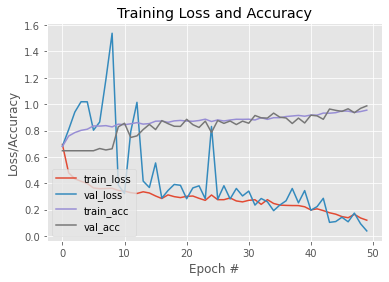

1001/1001 [==============================] - 0s 247us/sample - loss: 0.0377 - acc: 0.9870
loss : 0.03766111066224394
accuracy : 0.987013


In [49]:

# construct a plot that plots and saves the training history
N = np.arange(0, NUM_EPOCHS)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.plot(N, H.history["acc"], label="train_acc")
plt.plot(N, H.history["val_acc"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()
# plt.savefig(TRAINING_PLOT_PATH)

loss, accuracy = model.evaluate(testX, testY);
print("loss :", loss)
print("accuracy :", accuracy)


# 테스트

[INFO] loading model...
[INFO] predicting...
firePaths  ['Robbery_Accident_Fire_Database2/Fire/1101.jpg', 'Robbery_Accident_Fire_Database2/Fire/70.jpg', 'Robbery_Accident_Fire_Database2/Fire/449.jpg', 'Robbery_Accident_Fire_Database2/Fire/898.jpg', 'Robbery_Accident_Fire_Database2/Fire/636.jpg', 'Robbery_Accident_Fire_Database2/Fire/1135.jpg', 'Robbery_Accident_Fire_Database2/Fire/609.jpg', 'Robbery_Accident_Fire_Database2/Fire/822.jpg', 'Robbery_Accident_Fire_Database2/Fire/1230.jpg', 'Robbery_Accident_Fire_Database2/Fire/1173.jpg', 'Robbery_Accident_Fire_Database2/Fire/779.jpg', 'Robbery_Accident_Fire_Database2/Fire/1314.jpg', 'Robbery_Accident_Fire_Database2/Fire/938.jpg', 'Robbery_Accident_Fire_Database2/Fire/341.jpg', 'Robbery_Accident_Fire_Database2/Fire/663.jpg', 'Robbery_Accident_Fire_Database2/Fire/880.jpg', 'Robbery_Accident_Fire_Database2/Fire/66.jpg', 'Robbery_Accident_Fire_Database2/Fire/235.jpg', 'Robbery_Accident_Fire_Database2/Fire/549.jpg', 'Robbery_Accident_Fire_Datab

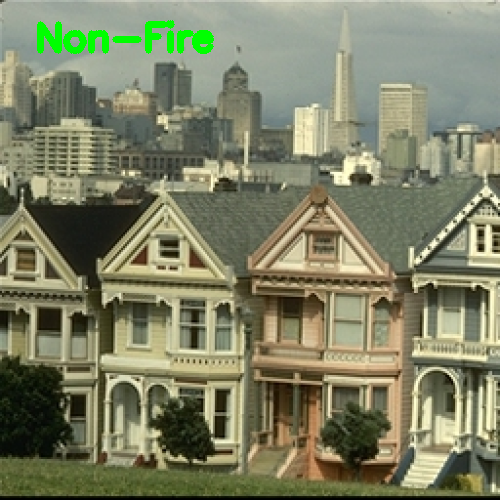

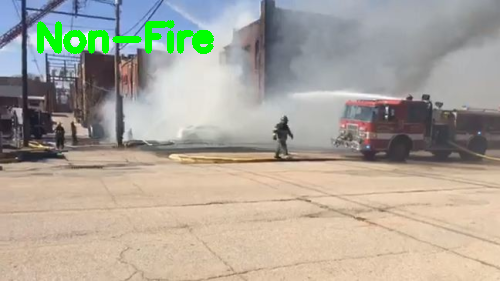

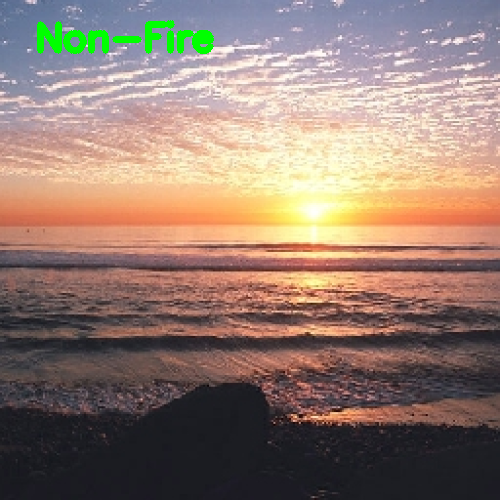

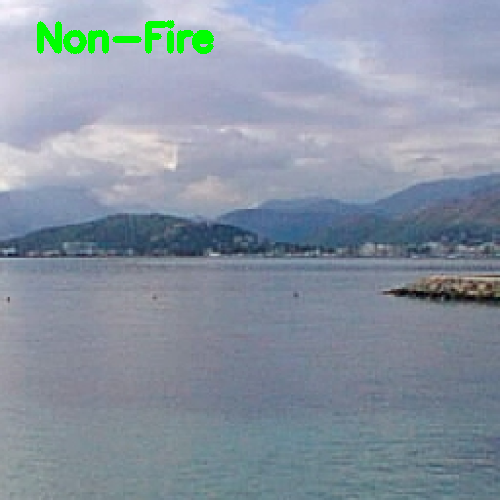

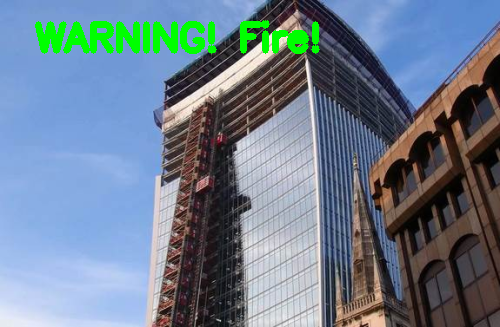

...

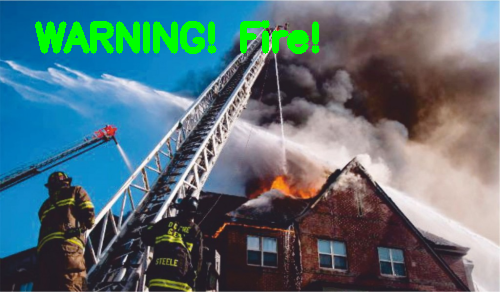

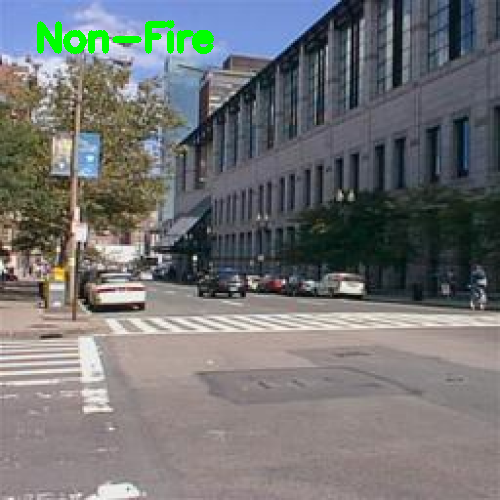

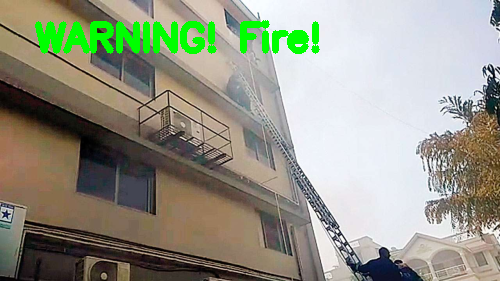

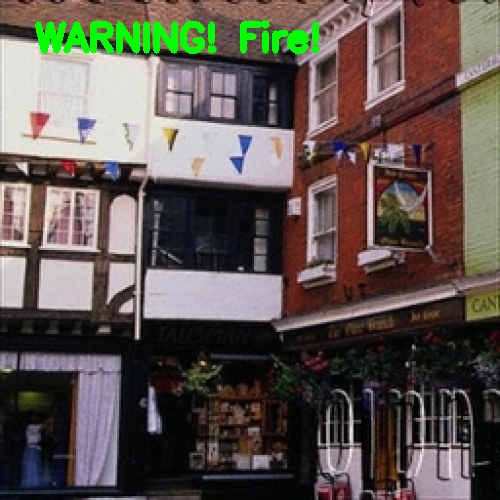

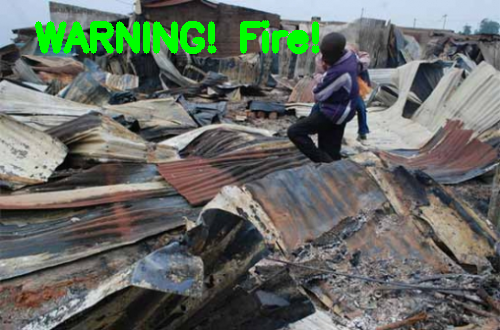

In [ ]:
# python predict_fire.py

# import the necessary packages
from tensorflow.keras.models import load_model
from imutils import paths
from IPython.display import Image
import numpy as np
import imutils
import random
import cv2
import os
import matplotlib.pyplot as plt
from IPython.display import Image, display
from google.colab.patches import cv2_imshow

# load the trained model from disk
print("[INFO] loading model...")
model = load_model(MODEL_PATH)

# grab the paths to the fire and non-fire images, respectively
print("[INFO] predicting...")
firePaths = list(paths.list_images(FIRE_PATH))
nonFirePaths = list(paths.list_images(NON_FIRE_PATH))
print("firePaths ",firePaths)
print(nonFirePaths)
# combine the two image path lists, randomly shuffle them, and sample
# them
imagePaths = firePaths + nonFirePaths
random.shuffle(imagePaths)
imagePaths = imagePaths[:SAMPLE_SIZE]
print(imagePaths)
print(OUTPUT_IMAGE_PATH)
# loop over the sampled image paths
for (i, imagePath) in enumerate(imagePaths):
	# load the image and clone it
	image = cv2.imread(imagePath)
	output = image.copy()
	# resize the input image to be a fixed 128x128 pixels, ignoring
	# aspect ratio
	image = cv2.resize(image, (128, 128))
	image = image.astype("float32") / 255.0
		
	# make predictions on the image
	preds = model.predict(np.expand_dims(image, axis=0))[0]
	j = np.argmax(preds)
	label = CLASSES[j]

	# draw the activity on the output frame
	text = label if label == "Non-Fire" else "WARNING! Fire!"
	output = imutils.resize(output, width=500)
	cv2.putText(output, text, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,
		1.25, (0, 255, 0), 5)

	# write the output image to disk	 
	filename = "{}.png".format(i)
	p = os.path.sep.join([OUTPUT_IMAGE_PATH, filename])
	cv2_imshow(output)
	# cv2.imwrite(p, output)
 
 
 

In [ ]:
from IPython.display import Image
Image('output/examples/0.png')
!ls output


fire_detection.model  training_plot.png
